In [1]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from typing import List
np.set_printoptions(threshold=np.inf)  

from fragment import *
from side import *
from sides_comparison import *
from utils import *
from puzzle import *
import global_values
from displaying import *
from assembled_groups import *


In [2]:
image_path = "disney_puzzle/aladin.jpg" 
# image_path = "angry.jpg"
output_folder = "fragments"
global_values.COL_NR = 20
global_values.ROW_NR = 20
fragments, tile_h, tile_w = divide_image(image_path, output_folder, global_values.COL_NR, global_values.ROW_NR)
global_values.TILE_H = global_values.TILE_W = max(tile_h, tile_w)


100%|██████████| 399/399 [00:18<00:00, 21.56it/s] 


new group
new group
new group
new group
new group
new group
new group
new group
new group
new group
adding piece to existing group 0
new group
new group
new group
new group
adding piece to existing group 9
new group
new group
new group
new group
adding piece to existing group 17
adding piece to existing group 4
new group
new group
adding piece to existing group 19
new group
new group
new group
adding piece to existing group 22
new group
adding piece to existing group 3
new group
new group
new group
new group
new group
adding piece to existing group 2
adding piece to existing group 9
------------------------------trying to paste group----------------------------------------------------------
anchor group: 9 pasted group: 6
original_first_anchor_row19 original_first_anchor_col 20
original_first_pasted_row19 original_first_pasted_col 19
first_pasted_row20 first_pasted_col 20
moving_dist_row1 moving_dist_col 1
new group
adding piece to existing group 11
adding piece to existing group 2
---

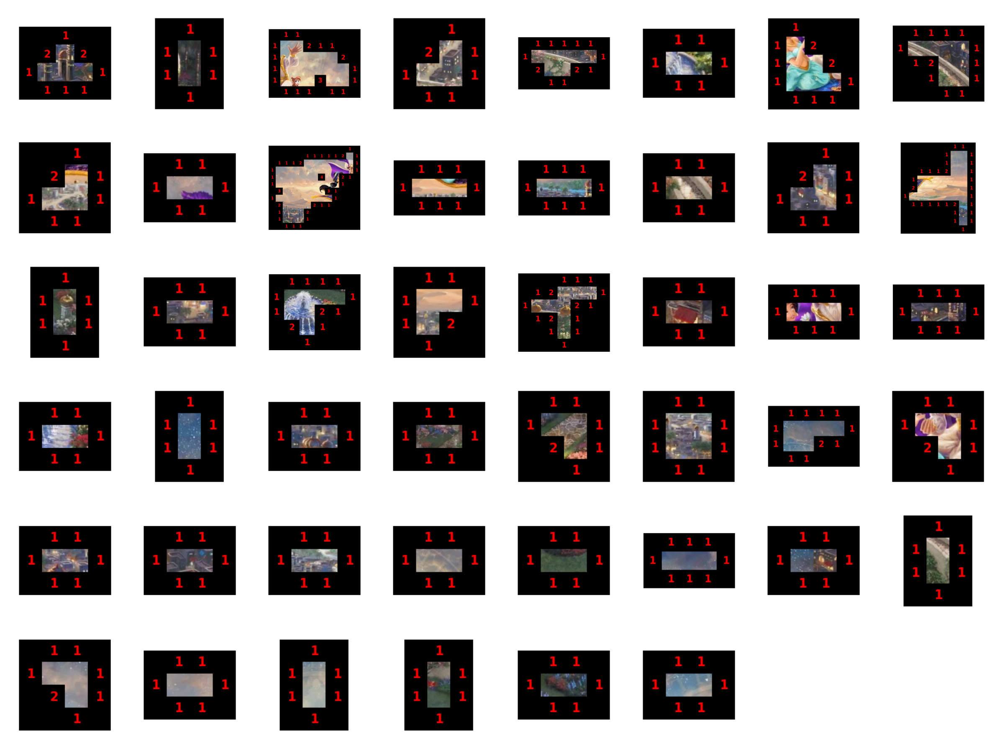

     group_idx  nr_of_neighbours  row  col
0           10                 4   14   24
1            2                 3   21   22
2           10                 3   16   18
3           10                 3   16   25
4            0                 2   19   18
..         ...               ...  ...  ...
395         11                 1   20   21
396         11                 1   20   20
397         11                 1   20   19
398         11                 1   19   22
399         12                 1   20   20

[400 rows x 4 columns]


In [ ]:

sides_comparisons = create_sides_comparisons(fragments)
sorted_sides_comparisons = sort_sides_comparisons(sides_comparisons)
# for s in sorted_sides_comparisons:
#     print(f"{s.side1} and {s.side2}")

groups = []
fragment_idx_to_group_idx = [None for fr in fragments]

for s in sorted_sides_comparisons:
    if s.score < 0.08:
        was_change = False
        ## if the fragments are both not merged and are different, process them
        if fragment_idx_to_group_idx[s.side1.fragment_idx] is not None and fragment_idx_to_group_idx[s.side2.fragment_idx] is not None:
            group_idx1 = fragment_idx_to_group_idx[s.side1.fragment_idx]
            group_idx2 = fragment_idx_to_group_idx[s.side2.fragment_idx]
            if group_idx1 == group_idx2:
                continue
            
            ## merge the groups
            new_fragment_idx_to_group_idx, new_groups = merge_groups(s,fragments, fragment_idx_to_group_idx, groups, group_idx1, group_idx2)

            ## if successful merge of the two groups
            if new_fragment_idx_to_group_idx is not None and new_groups is not None:
                fragment_idx_to_group_idx = new_fragment_idx_to_group_idx
                groups = new_groups
                was_change = True

        else:
            ## if both fragments are not merged, create new group with them
            if fragment_idx_to_group_idx[s.side1.fragment_idx] is None and fragment_idx_to_group_idx[s.side2.fragment_idx] is None:
                print("new group")
                if check_if_two_fragments_are_vertical(s):
                    new_group = assembledGroup(s)
                    groups.append(new_group)
                    fragment_idx_to_group_idx[s.side1.fragment_idx] = len(groups)-1
                    fragment_idx_to_group_idx[s.side2.fragment_idx] = len(groups)-1
                    was_change = True
                    
            ## if one fragment is merged in a group and the other is not, add the fragment to the group
            else:
                side1_group_idx = fragment_idx_to_group_idx[s.side1.fragment_idx]
                side2_group_idx = fragment_idx_to_group_idx[s.side2.fragment_idx]

                if side1_group_idx is not None and side2_group_idx is None:
                    print(f"adding piece to existing group {side1_group_idx}")
                    if groups[side1_group_idx].add_fragment(fragments, s.side1, s.side2):
                        fragment_idx_to_group_idx[s.side2.fragment_idx] = side1_group_idx
                        was_change = True

                elif side2_group_idx is not None and side1_group_idx is None:
                    print(f"adding piece to existing group {side2_group_idx}")
                    if groups[side2_group_idx].add_fragment(fragments, s.side2, s.side1):
                        fragment_idx_to_group_idx[s.side1.fragment_idx] = side2_group_idx
                        was_change = True
    # if was_change:
        # print("--------------------------------------------------------------------")
        # print(f"{s.side1} and {s.side2}\n\n")
    #     for group_idx, group in enumerate(groups):
    #         print(f"group fragments: {group.used_fragments}")
    #         print(f"group positions: {group.fragment_positions}")
    #         group.show(fragments)

groups_img = []
for group_idx, group in enumerate(groups):
    print(f"group {group_idx}")
    print(f"group fragments: {group.used_fragments}")
    print(f"group positions: {group.fragment_positions}")
    group.nr_of_neighbours_grid()
    gr_img = group.show_no_background(fragments, 1)
    groups_img.append(gr_img)


show_all_groups(groups_img)

edges_of_groups_df = edges_of_groups(groups)
print(edges_of_groups_df)

In [8]:
n = len(fragments)
s = 4  
comparisons = [[[[None for _ in range(s)] for _ in range(s)] for _ in range(n)] for _ in range(n)]
for c in sides_comparisons:
    comparisons[c.side1.fragment_idx][c.side2.fragment_idx][c.side1.side_idx][c.side2.side_idx] = c
    comparisons[c.side2.fragment_idx][c.side1.fragment_idx][c.side2.side_idx][c.side1.side_idx] = c
    
# for fr_idx1 in range(n):
#     print(f"comparisons to fragment {fr_idx1}")
#     for fr_idx2 in range(n):
#         for side1 in range(s):
#             for side2 in range(s):
#                 comp = comparisons[fr_idx1][fr_idx2][side1][side2]
#                 if comp is not None:
#                     print(comp)  

def get_comparison(frag1, frag2, side1, side2):
    comp = comparisons[frag1][frag2][side1][side2]
    if comp is None:
        comp = comparisons[frag2][frag1][side2][side1]  
    if comp is None:
        print(f"Comparison missing for f1={frag1}, f2={frag2}, s1={side1}, s2={side2}")

    return comp


print(comparisons[5])

[[[None, None, <sides_comparison.SidesComparison object at 0x75855b932f50>, None], [None, None, None, <sides_comparison.SidesComparison object at 0x75855b973a60>], [<sides_comparison.SidesComparison object at 0x75855babda20>, None, None, None], [None, <sides_comparison.SidesComparison object at 0x75855b8fa440>, None, None]], [[None, None, <sides_comparison.SidesComparison object at 0x75855b869b40>, None], [None, None, None, <sides_comparison.SidesComparison object at 0x75855b8a6620>], [<sides_comparison.SidesComparison object at 0x75855b7e8580>, None, None, None], [None, <sides_comparison.SidesComparison object at 0x75855b829060>, None, None]], [[None, None, <sides_comparison.SidesComparison object at 0x75855844c670>, None], [None, None, None, <sides_comparison.SidesComparison object at 0x75855848d120>], [<sides_comparison.SidesComparison object at 0x7585583970a0>, None, None, None], [None, <sides_comparison.SidesComparison object at 0x7585583d7b80>, None, None]], [[None, None, <sides_

anchor group idx: 10 with space at 14 24
left: 105 right: 107 top: 86 bottom: 126
nr of neighbours: 4
adding piece to existing group 10
group 0
group fragments: [238, 258, 257, 317]
group positions: {238: [19, 19], 258: [20, 19], 257: [20, 18], 317: [20, 20]}
group 1
group fragments: [260, 280]
group positions: {260: [19, 19], 280: [20, 19]}
group 2
group fragments: [92, 112, 72, 73, 132, 93, 94, 113, 114, 134, 115, 116, 117, 133, 136, 137, 95, 96]
group positions: {92: [19, 19], 112: [20, 19], 72: [18, 19], 73: [18, 20], 132: [21, 19], 93: (19, 20), 94: (19, 21), 113: (20, 20), 114: [20, 21], 134: [21, 21], 115: (20, 22), 116: (20, 23), 117: (20, 24), 133: [21, 20], 136: (21, 23), 137: (21, 24), 95: [19, 22], 96: [19, 23]}
group 3
group fragments: [247, 248, 228]
group positions: {247: [19, 19], 248: [19, 20], 228: [18, 20]}
group 4
group fragments: [270, 271, 272, 269, 290, 291, 273]
group positions: {270: [19, 19], 271: [19, 20], 272: [19, 21], 269: [19, 18], 290: (20, 19), 291: (20

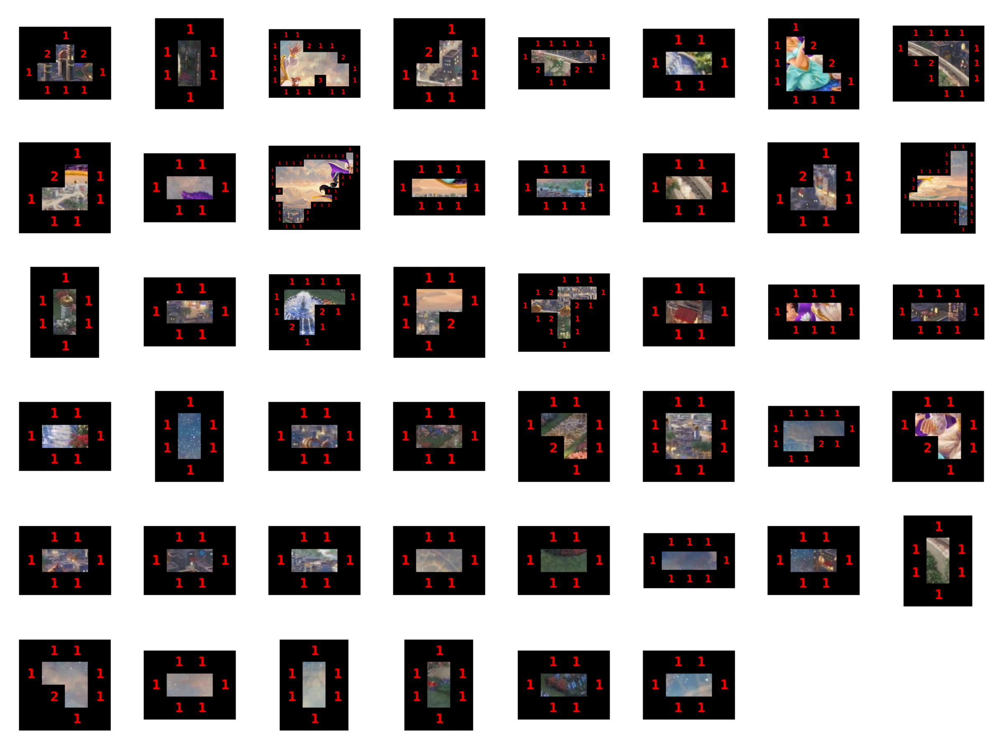

     group_idx  nr_of_neighbours  row  col
0            2                 3   21   22
1           10                 3   16   18
2           10                 3   16   25
3            0                 2   19   20
4            4                 2   20   21
..         ...               ...  ...  ...
394         11                 1   20   21
395         11                 1   20   20
396         11                 1   20   19
397         11                 1   19   22
398         12                 1   20   20

[399 rows x 4 columns]


In [ ]:
anchor_group_idx = edges_of_groups_df["group_idx"][0]
empty_row = edges_of_groups_df["row"][0]
empty_col = edges_of_groups_df["col"][0]
top_fragment_idx = None
bottom_fragment_idx = None
left_fragment_idx = None
right_fragment_idx = None

nr_of_neighbours = groups[anchor_group_idx].neighbours_grid[empty_row][empty_col]

### find the edge fragments of the empty spot
if groups[anchor_group_idx].grid[empty_row - 1][empty_col] is not None:
    top_fragment_idx = groups[anchor_group_idx].grid[empty_row - 1][empty_col]

if groups[anchor_group_idx].grid[empty_row + 1][empty_col] is not None:
    bottom_fragment_idx = groups[anchor_group_idx].grid[empty_row + 1][empty_col]

if groups[anchor_group_idx].grid[empty_row][empty_col - 1] is not None:
    left_fragment_idx = groups[anchor_group_idx].grid[empty_row][empty_col - 1]

if groups[anchor_group_idx].grid[empty_row][empty_col + 1] is not None:
    right_fragment_idx = groups[anchor_group_idx].grid[empty_row][empty_col + 1]

print(f"anchor group idx: {anchor_group_idx} with space at {empty_row} {empty_col}")
print(f"left: {left_fragment_idx} right: {right_fragment_idx} top: {top_fragment_idx} bottom: {bottom_fragment_idx}")
print(f"nr of neighbours: {nr_of_neighbours}")

## find the best match by score
fragments_compatibility_for_empty_spot = np.zeros(n)

for fr_idx in range(len(fragments)):
    if fr_idx in [top_fragment_idx, bottom_fragment_idx, left_fragment_idx, right_fragment_idx]:
        fragments_compatibility_for_empty_spot[fr_idx] = None
        continue
    if fragment_idx_to_group_idx[fr_idx] is not None:
        fragments_compatibility_for_empty_spot[fr_idx] = None
        continue
    score = 0
    if top_fragment_idx is not None:
        comp = get_comparison(top_fragment_idx, fr_idx, 2, 0)
        if comp: score += comp.score
    if bottom_fragment_idx is not None:
        comp = get_comparison(bottom_fragment_idx, fr_idx, 0, 2)
        if comp: score += comp.score
    if left_fragment_idx is not None:
        comp = get_comparison(left_fragment_idx, fr_idx, 1, 3)
        if comp: score += comp.score
    if right_fragment_idx is not None:
        comp = get_comparison(right_fragment_idx, fr_idx, 3, 1)
        if comp: score += comp.score

    fragments_compatibility_for_empty_spot[fr_idx] = score


# Sort by compatibility
sorted_indices = np.argsort(fragments_compatibility_for_empty_spot)
sorted_values = fragments_compatibility_for_empty_spot[sorted_indices]

best_fragment_idx_for_empty_spot = sorted_indices[0]

# paste fragment into empty spot

if top_fragment_idx is not None:
    comp = get_comparison(top_fragment_idx, best_fragment_idx_for_empty_spot, 2, 0)
elif bottom_fragment_idx is not None:
    comp = get_comparison(bottom_fragment_idx, fr_idx, 0, 2)
elif left_fragment_idx is not None:
    comp = get_comparison(left_fragment_idx, fr_idx, 1, 3)
elif right_fragment_idx is not None:
    comp = get_comparison(right_fragment_idx, fr_idx, 3, 1)

    if comp.side1.fragment_idx == best_fragment_idx_for_empty_spot:
        side1 = comp.side2
        side2 = comp.side1
    else:
        side1 = comp.side1
        side2 = comp.side2

    print(f"adding piece to existing group {anchor_group_idx}")
    if groups[anchor_group_idx].add_fragment(fragments, side1, side2):
        fragment_idx_to_group_idx[best_fragment_idx_for_empty_spot] = anchor_group_idx
        was_change = True



groups_img = []
for group_idx, group in enumerate(groups):
    print(f"group {group_idx}")
    print(f"group fragments: {group.used_fragments}")
    print(f"group positions: {group.fragment_positions}")
    group.nr_of_neighbours_grid()
    gr_img = group.show_no_background(fragments, 1)
    groups_img.append(gr_img)


show_all_groups(groups_img)

edges_of_groups_df = edges_of_groups(groups)
print(edges_of_groups_df)

# for idx in sorted_indices[:100]:  

#     print(f"idx: {idx} value: {fragments_compatibility_for_empty_spot[idx]}")
#     print(f"fragment in group: {fragment_idx_to_group_idx[idx]}")
#     if top_fragment_idx is not None:
#         comp = get_comparison(top_fragment_idx, idx, 2, 0)
#         if comp: display_the_fragments_matching_sides(fragments, comp)

#     if bottom_fragment_idx is not None:
#         comp = get_comparison(bottom_fragment_idx, idx, 0, 2)
#         if comp: display_the_fragments_matching_sides(fragments, comp)


In [6]:
for c in sorted_sides_comparisons:
    print(c.score)

0.005328353403382469
0.005723482123005086
0.006316477114345408
0.007043715488458832
0.009116000878560002
0.009597020709293977
0.011809105579400793
0.01253000618195566
0.01293971570547209
0.014524870918618111
0.014616612775616477
0.015027039139570347
0.015344197749403264
0.01590765003845587
0.01626157982237758
0.017354116310970398
0.018911369213543677
0.019040939403177696
0.019311071960952
0.020094426248301735
0.020143680216456628
0.020218150214697136
0.021631196094400493
0.022109639011194056
0.02386323352979694
0.02406532281617038
0.024762884110979485
0.02490140853384717
0.02494760568786293
0.025310069276507693
0.0261024765990364
0.02645623728789901
0.026705600887928567
0.02685817102967843
0.02749963392708106
0.02756770023437001
0.027614724755559622
0.028588479529178045
0.02912425947369724
0.029287952570644822
0.029713373058476367
0.029945875300414274
0.030632263173650233
0.030678813173850024
0.031056960142587825
0.031614027896520715
0.03200124281232593
0.032155395818711276
0.033108058

In [7]:
#  masura de performanta
# greedy -> contrangeri
# piese rotite
# similaritate cu retea
